In [1]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms as transforms

from util.util import tensor2im as tensor2img

%matplotlib inline
%config InlineBackend.figure_format='retina'

def plot_single_image(image, grid=0, call=False):
    plt.grid(grid)
    plt.imshow(image)
    if not call:
        plt.show()

def plot_multi_images(*images, grid=0):
    n = len(images)
    assert n, "Func needs at least 2 image as param!"
    row_colum = 100 + n * 10
    plt.figure(figsize=(5*n, 8),dpi=60)
    for i, image in enumerate(images):
        plt.subplot(row_colum + i + 1)
        plot_single_image(image, grid=grid, call=True)
    plt.show()

def plot_single_heatmap(array, cmap='viridis', title=None, dpi=60):
    plt.figure(figsize=(5, 5), dpi=dpi)
    if title:
        plt.title(title)
    if isinstance(array, torch.Tensor):
        array = array.cpu().numpy()
    sns.heatmap(array, square=True, cmap=cmap)

def plot_multi_heatmap(*arrays, cmap='viridis', title=None, row=None, col=None):
    n = len(arrays)
    if row is not None:
        col = int(np.ceil(n / row))
    else:
        if col is not None:
            row = int(np.ceil(n / col))
        else:
            row = int(np.sqrt(n))
            col = int(np.ceil(n / row))

    fig, ax = plt.subplots(row, col, figsize=(6*col, 4*row), dpi = 60)
    if title is not None: fig.suptitle(title)

    for i, array in enumerate(arrays):
        if isinstance(array, torch.Tensor):
            array = array.cpu().numpy()
        r = i // col
        c = i % col
        axi = ax[r, c] if row > 1 else ax[c]
        sns.heatmap(array, square=True, cmap=cmap, ax=axi)
    plt.show()


# 这部分是直接从源代码中抄的img2tensor 和 tensor2img
transform_list = [transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
tf = transforms.Compose(transform_list)

def img2tensor(image):
    image = np.ascontiguousarray(image)
    return tf(image).unsqueeze(0).to(device)

In [2]:
device = torch.device("cuda")
from models.networks import ResnetGenerator, NLayerDiscriminator

# 测试生成ResnetGen 网络

In [3]:
resnet = ResnetGenerator(3, 3, n_blocks=9).to(device)

In [4]:
resnet

ResnetGenerator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), bias=False)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
        (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): ReLU(inplace=True)
        (4): Reflect

In [5]:
resnet.features

[]

In [6]:
x = torch.rand((1, 3, 640, 640), device=device)

In [7]:
output = resnet(x)

In [8]:
output.shape

torch.Size([1, 3, 640, 640])

## 输出特征层数量以及对应的特征层编号

In [9]:
print(len(resnet.features))
print(resnet.detach_layer)

4
[2, 4, 6, 8]


In [10]:
for feature in resnet.features:
    print(feature.shape)

torch.Size([1, 64, 640, 640])
torch.Size([1, 128, 320, 320])
torch.Size([1, 128, 320, 320])
torch.Size([1, 256, 160, 160])


# 测试判断网络PatchGan Discriminator

In [11]:
patch = NLayerDiscriminator(3).to(device)
patch

NLayerDiscriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [12]:
# torch.jit.save(torch.jit.trace(resnet, (x)), "resnetG.pt")
# torch.save(resnet.state_dict(), "dict.pth")

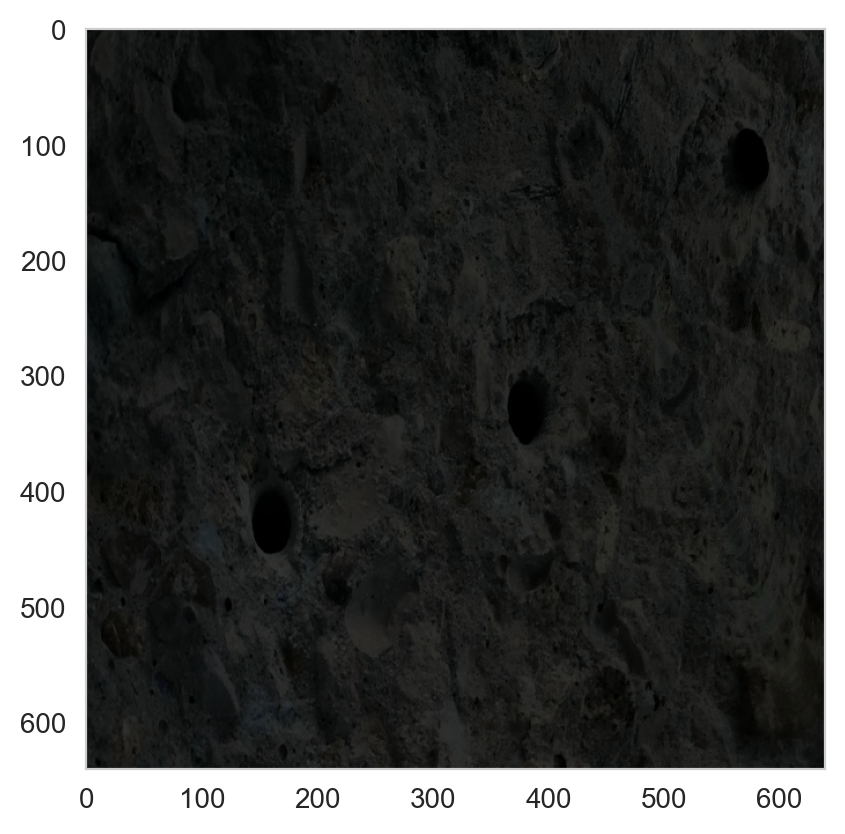

In [13]:
img = cv2.imread("../bh-recrop/datasets_out/trainA/bh_2_r0.jpg")
plot_single_image(img)

In [14]:
inputs = img2tensor(img)
inputs.shape

torch.Size([1, 3, 640, 640])

In [15]:
inputs.max()

tensor(-0.5686, device='cuda:0')

In [16]:
output = resnet(inputs)

In [17]:
output.shape

torch.Size([1, 3, 640, 640])

In [18]:
output = output.squeeze() * 255.0
out_img = output.detach().cpu().numpy().transpose([1,2,0]).astype(np.uint8)

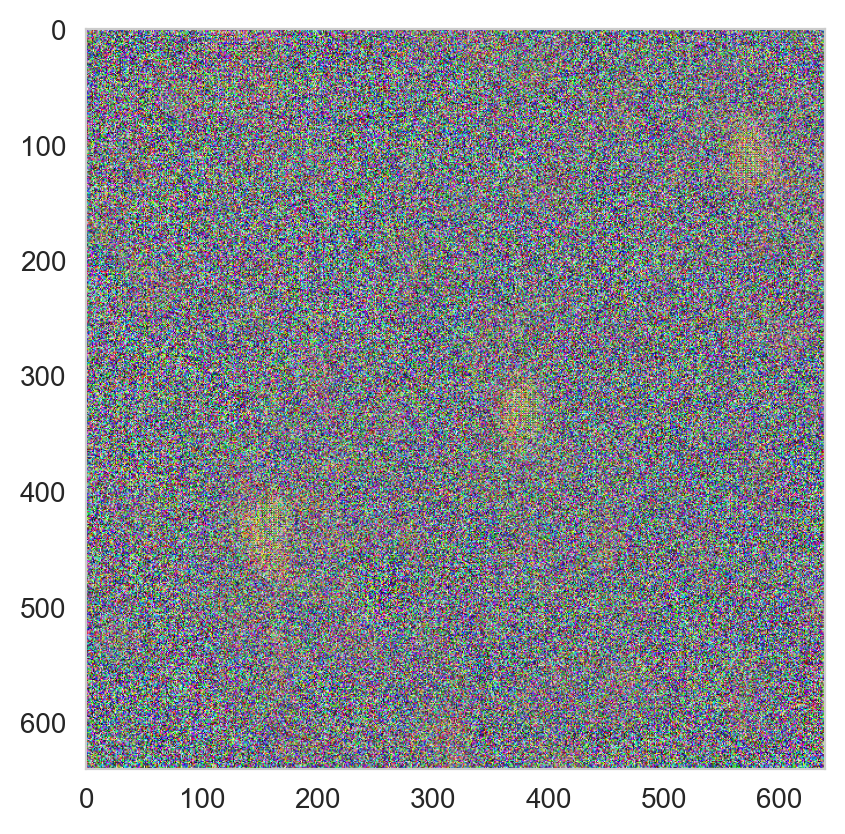

In [19]:
plot_single_image(out_img)

In [20]:
features = resnet.features
len(features)

4

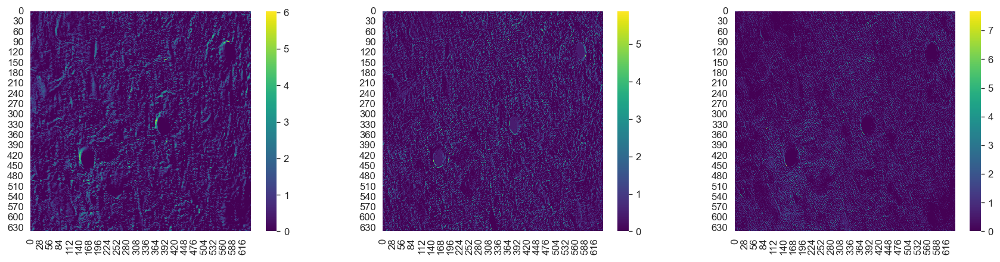

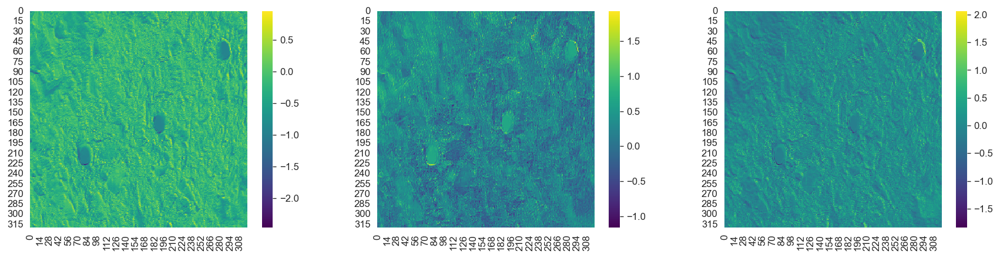

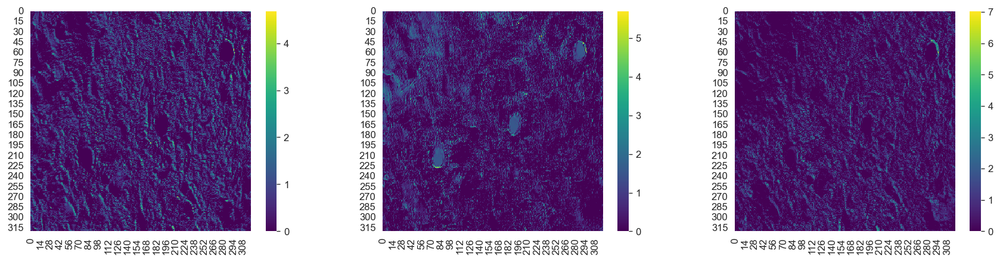

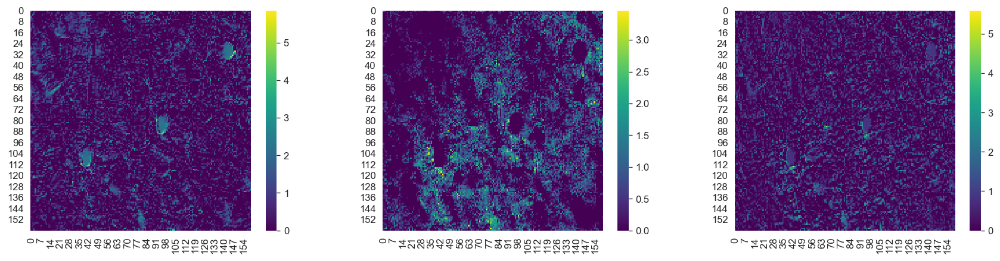

In [21]:
for feature in features:
    plot_multi_heatmap(*(feature[0,i] for i in range(3)))

# 测试作者训练好的pretrained模型，本模型直接使用py39 test.py --dataroot datasets/horse2zebra/testA --name horse2zebra_pretrained --model test --no_dropout 运行完全没问题

In [22]:
from models import create_model

class Args:
    def __init__(self):
        # --name horse2zebra_pretrained --model test --no_dropout
        self.name = "horse2zebra_pretrained"
        self.model = "test"
        self.no_dropout = True
        self.isTrain = False
        self.gpu_ids = [0]
        self.checkpoints_dir = './checkpoints'
        self.preprocess = "none"
        self.model_suffix = ""
        self.input_nc = 3
        self.output_nc = 3
        self.ngf = 64
        self.netG = "resnet_9blocks"
        self.netD = "basic"
        self.norm = "instance"
        self.init_type = "normal"
        self.init_gain = 0.02
        self.dataroot  = "datasets/horse2zebra/testA"
        self.eval = True
        self.load_iter = 0
        self.epoch = 'latest'
        self.verbose = False

opt = Args()

model = create_model(opt)
model.setup(opt)

initialize network with normal
model [TestModel] was created
loading the model from ./checkpoints/horse2zebra_pretrained/latest_net_G.pth
---------- Networks initialized -------------
[Network G] Total number of parameters : 11.378 M
-----------------------------------------------


# 观察网络结构，确定清楚具体要从哪一层末尾detach特征向量层，并且直接修改输出层数的数组

In [23]:
model.eval()
model.print_networks(verbose=True)

---------- Networks initialized -------------
DataParallel(
  (module): ResnetGenerator(
    (model): Sequential(
      (0): ReflectionPad2d((3, 3, 3, 3))
      (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
      (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (3): ReLU(inplace=True)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (9): ReLU(inplace=True)
      (10): ResnetBlock(
        (conv_block): Sequential(
          (0): ReflectionPad2d((1, 1, 1, 1))
          (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
          (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, tra

In [24]:
model = model.netG
model.module.detach_layer = [3, 6, 9, 18, 21, 24, 27]

# 模型和特征层设置好了之后，就可以拿一张图片测试了

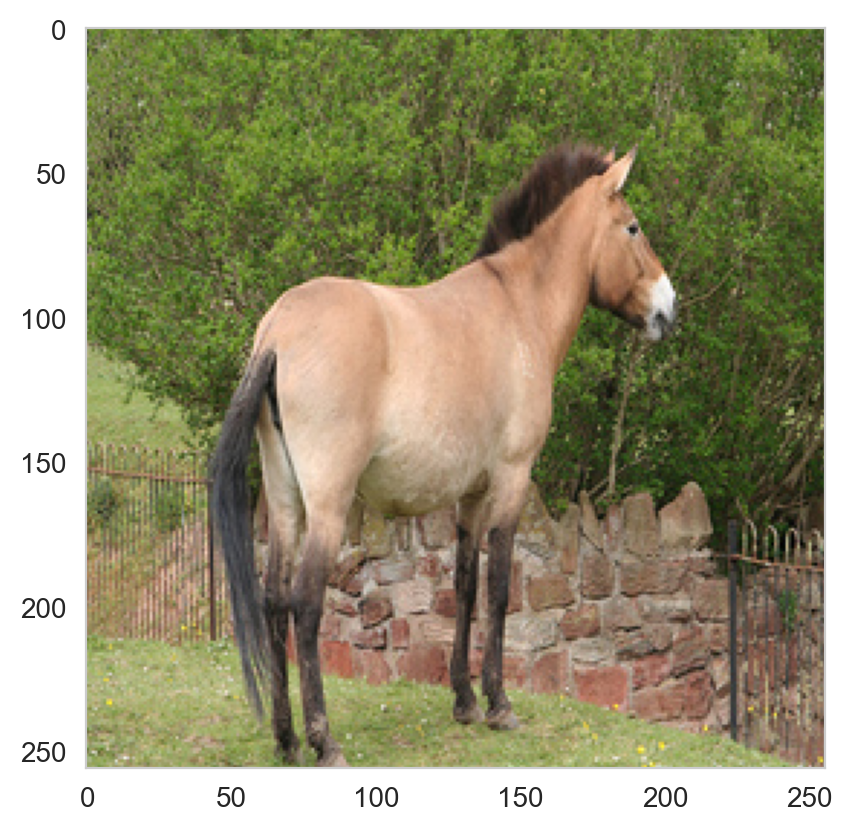

In [25]:
horse = cv2.imread("datasets/horse2zebra/testA/n02381460_2100.jpg")[..., ::-1]
plot_single_image(horse)

In [26]:
h = img2tensor(horse)
out = model(h)

In [27]:
# out = out.squeeze().permute(1,2,0)
out.shape

torch.Size([1, 3, 256, 256])

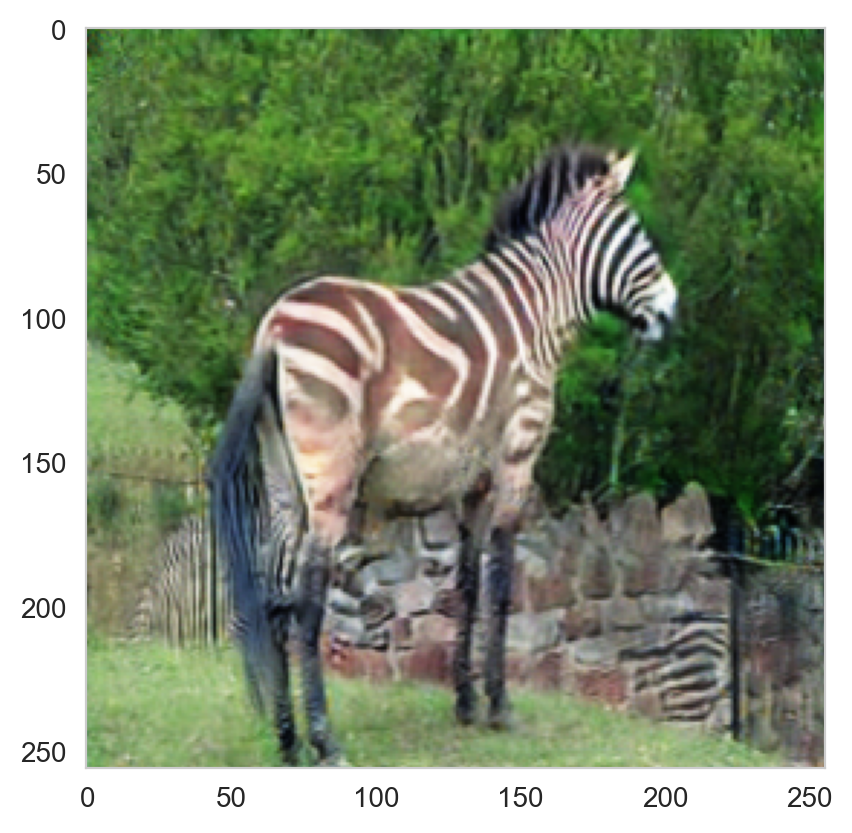

In [28]:
out_img = tensor2img(out)
plot_single_image(out_img)

In [29]:
features = model.module.features
len(features)

7

# 输出想要的各特征层的张量(前5张，实际有很多很多张)

torch.Size([1, 64, 256, 256])


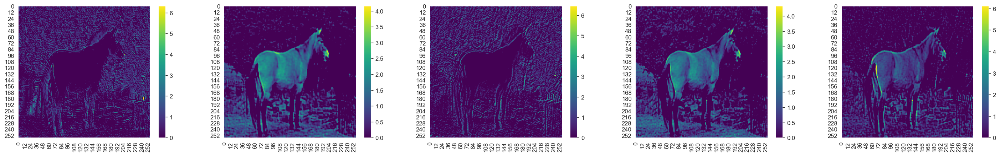

torch.Size([1, 128, 128, 128])


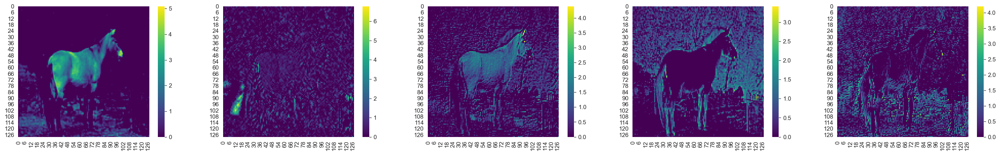

torch.Size([1, 256, 64, 64])


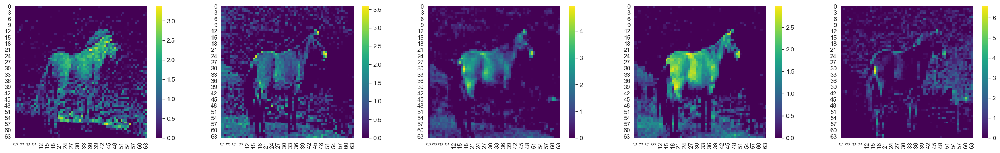

torch.Size([1, 256, 64, 64])


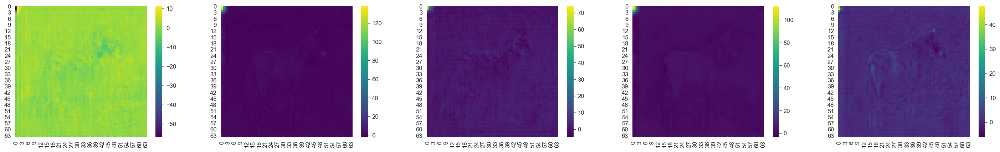

torch.Size([1, 128, 128, 128])


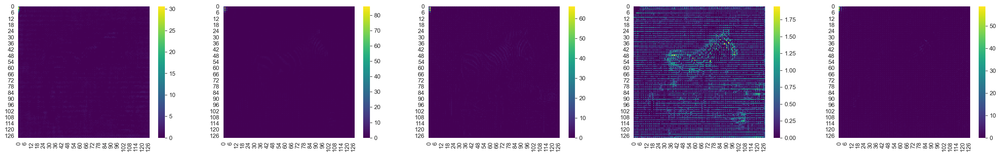

torch.Size([1, 64, 256, 256])


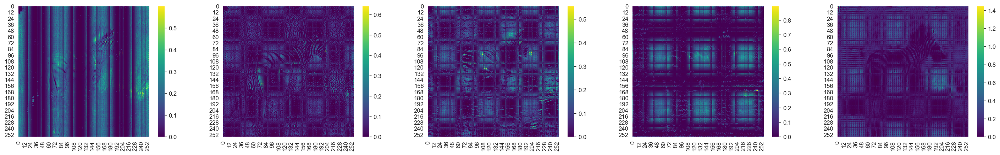

torch.Size([1, 3, 256, 256])


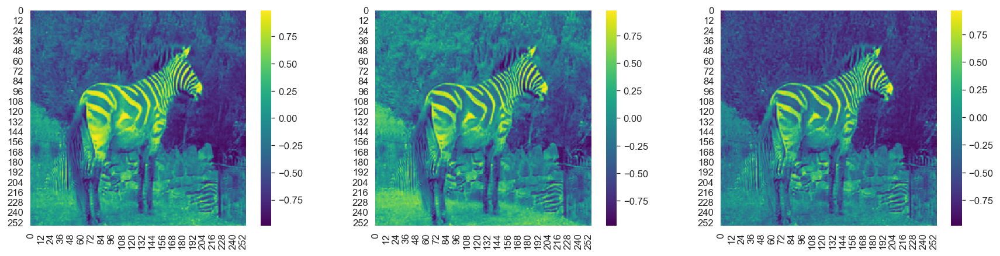

In [30]:
for feature in features:
    print(feature.shape)
    col = min(5, feature.shape[1])
    plot_multi_heatmap(*(feature[0,i] for i in range(col)), col=col)